In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from IPython.display import Image  
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import export_graphviz
import pydotplus
import seaborn as sns
import pickle as pk

In [2]:
df = pd.read_csv("Outlier_removed.csv")
df

,age,fnlwgt,education_num,sex,capital_gain,capital_loss,hours_per_week,salary,workclass,marital_status,occupation,relationship,race,country
0,39,77516,13,0,2174,0,40,0,1279,9711,3719,7714,25912,27608
1,50,83311,13,0,0,0,13,0,2498,14059,3991,12457,25912,27608
2,38,215646,9,0,0,0,40,0,22264,4212,1349,7714,25912,27608
3,53,234721,7,0,0,0,40,0,22264,14059,1349,12457,2816,27608
4,28,338409,13,1,0,0,40,0,22264,14059,4034,1406,2816,1220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29999,27,257302,12,1,0,0,38,0,22264,14059,911,1406,25912,27608
30000,40,154374,9,0,0,0,40,1,22264,14059,1964,12457,25912,27608
30001,58,151910,9,1,0,0,40,0,22264,827,3719,3211,25912,27608
30002,22,201490,9,0,0,0,20,0,22264,9711,3719,4462,25912,27608


In [3]:
X = df.drop(columns = ['salary'])
y = df['salary']

In [110]:
X.age.sort_values(ascending=True)

20238    17
10495    17
4255     17
8958     17
23469    17
         ..
14650    90
9391     90
1773     90
17978    90
4814     90
Name: age, Length: 30004, dtype: int64

In [111]:
X.fnlwgt.sort_values(ascending=True)

25088     13769
23737     14878
22140     18827
9960      19214
1631      19302
          ...  
6174     595000
5046     595000
20358    595088
22219    595461
3403     596776
Name: fnlwgt, Length: 30004, dtype: int64

In [112]:
X.capital_gain.sort_values(ascending=True)

15001        0
18390        0
18389        0
18388        0
18387        0
         ...  
1537     99999
22404    99999
22606    99999
14662    99999
5978     99999
Name: capital_gain, Length: 30004, dtype: int64

In [113]:
X.capital_loss.sort_values(ascending=True)

0           0
19781       0
19780       0
19779       0
19778       0
         ... 
14697    3770
10956    3770
18832    3900
21946    3900
13600    4356
Name: capital_loss, Length: 30004, dtype: int64

In [114]:
X.hours_per_week.sort_values(ascending=True)

19281     1
21172     1
174       1
18221     1
10538     1
         ..
24205    99
23817    99
21971    99
20484    99
21573    99
Name: hours_per_week, Length: 30004, dtype: int64

In [4]:
X.columns

Index(['age', 'fnlwgt', 'education_num', 'sex', 'capital_gain', 'capital_loss',
       'hours_per_week', 'workclass', 'marital_status', 'occupation',
       'relationship', 'race', 'country'],
      dtype='object')

In [5]:
X = X[['sex', 'age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss',
       'hours_per_week', 'workclass', 'marital_status', 'occupation',
       'relationship', 'race', 'country']]
X

,sex,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,workclass,marital_status,occupation,relationship,race,country
0,0,39,77516,13,2174,0,40,1279,9711,3719,7714,25912,27608
1,0,50,83311,13,0,0,13,2498,14059,3991,12457,25912,27608
2,0,38,215646,9,0,0,40,22264,4212,1349,7714,25912,27608
3,0,53,234721,7,0,0,40,22264,14059,1349,12457,2816,27608
4,1,28,338409,13,0,0,40,22264,14059,4034,1406,2816,1220
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29999,1,27,257302,12,0,0,38,22264,14059,911,1406,25912,27608
30000,0,40,154374,9,0,0,40,22264,14059,1964,12457,25912,27608
30001,1,58,151910,9,0,0,40,22264,827,3719,3211,25912,27608
30002,0,22,201490,9,0,0,20,22264,9711,3719,4462,25912,27608


In [6]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size= 0.25, random_state = 286)

In [7]:
X_test

,sex,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,workclass,marital_status,occupation,relationship,race,country
19903,0,34,175856,13,3103,0,55,22264,14059,3991,12457,25912,27608
14700,0,28,346406,9,0,1672,50,22264,14059,1964,12457,25912,27608
23737,0,46,14878,15,0,0,40,2067,14059,4034,12457,894,492
3406,0,43,147110,10,0,0,48,22264,9711,3719,3211,25912,27608
5969,0,45,202496,13,0,0,37,22264,14059,1349,12457,25912,27608
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16767,1,52,155233,10,0,0,40,22264,4212,3719,3211,25912,27608
28511,0,42,569930,13,0,0,45,2067,14059,3719,12457,25912,27608
6227,1,67,217028,14,0,0,40,22264,9711,3209,7714,25912,27608
29673,0,27,100669,10,0,0,40,22264,14059,4025,12457,894,492


In [8]:
X_train

,sex,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,workclass,marital_status,occupation,relationship,race,country
3142,1,53,99476,9,0,0,38,22264,4212,3209,7714,25912,27608
12055,0,40,201764,9,0,0,40,22264,4212,4025,7714,25912,27608
12307,1,24,317443,13,0,0,40,2067,14059,4034,1406,2816,27608
4383,0,33,209900,10,0,0,20,22264,9711,911,4462,25912,27608
26320,1,47,176239,10,0,0,40,22264,827,4034,3211,25912,27608
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24952,0,59,279232,6,0,0,40,22264,14059,1572,12457,25912,1220
25884,0,54,357596,13,7298,0,55,1074,14059,3991,12457,25912,27608
1317,0,36,336595,9,0,0,50,22264,14059,3991,12457,25912,27608
4431,0,35,46385,9,5178,0,90,22264,14059,1572,12457,25912,27608


In [109]:
y_train

3142     0
12055    0
12307    0
4383     0
26320    0
        ..
24952    0
25884    1
1317     1
4431     1
18893    0
Name: salary, Length: 22503, dtype: int64

# Feature Scaling

In [9]:
sc = StandardScaler()
X_train.iloc[:, 1:] = sc.fit_transform(X_train.iloc[:, 1:])
X_test.iloc[:, 1:] = sc.transform(X_test.iloc[:, 1:])

/home/maverick14k/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1738: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value[:, i].tolist(), pi)
/home/maverick14k/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1738: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value[:, i].tolist(), pi)


In [91]:
pk.dump(sc, open('scale.pickle', 'wb'))

In [98]:
X_test

,sex,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,workclass,marital_status,occupation,relationship,race,country
19903,0,-0.341553,-0.113525,1.129022,0.281787,-0.218895,1.170109,0.594174,0.871185,0.740938,1.061496,0.400545,0.301705
14700,0,-0.797608,1.625535,-0.434881,-0.149209,3.916711,0.753446,0.594174,0.871185,-1.095223,1.061496,0.400545,0.301705
23737,0,0.570556,-1.754982,1.910973,-0.149209,-0.218895,-0.079881,-1.652368,0.871185,0.779890,1.061496,-2.637272,-3.349445
3406,0,0.342529,-0.406642,-0.043905,-0.149209,-0.218895,0.586780,0.594174,-0.140982,0.494546,-1.246862,0.400545,0.301705
5969,0,0.494547,0.158117,1.129022,-0.149209,-0.218895,-0.329879,0.594174,0.871185,-1.652322,1.061496,0.400545,0.301705
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16767,1,1.026611,-0.323813,-0.043905,-0.149209,-0.218895,-0.079881,0.594174,-1.421088,0.494546,-1.246862,0.400545,0.301705
28511,0,0.266520,3.904759,1.129022,-0.149209,-0.218895,0.336782,-1.652368,0.871185,0.494546,1.061496,0.400545,0.301705
6227,1,2.166748,0.306296,1.519998,-0.149209,-0.218895,-0.079881,0.594174,-0.140982,0.032562,-0.122642,0.400545,0.301705
29673,0,-0.873617,-0.880190,-0.043905,-0.149209,-0.218895,-0.079881,0.594174,0.871185,0.771737,1.061496,-2.637272,-3.349445


In [11]:
X_train

,sex,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,workclass,marital_status,occupation,relationship,race,country
3142,1,1.102620,-0.892355,-0.434881,-0.149209,-0.218895,-0.246547,0.594174,-1.421088,0.032562,-0.122642,0.400545,0.301705
12055,0,0.114502,0.150653,-0.434881,-0.149209,-0.218895,-0.079881,0.594174,-1.421088,0.771737,-0.122642,0.400545,0.301705
12307,1,-1.101644,1.330206,1.129022,-0.149209,-0.218895,-0.079881,-1.652368,0.871185,0.779890,-1.697498,-2.403893,0.301705
4383,0,-0.417562,0.233614,-0.043905,-0.149209,-0.218895,-1.746535,0.594174,-0.140982,-2.049085,-0.934537,0.400545,0.301705
26320,1,0.646566,-0.109620,-0.043905,-0.149209,-0.218895,-0.079881,0.594174,-2.209079,0.779890,-1.246862,0.400545,0.301705
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24952,0,1.558675,0.940577,-1.607808,-0.149209,-0.218895,-0.079881,0.594174,0.871185,-1.450317,1.061496,0.400545,-3.251420
25884,0,1.178629,1.739637,1.129022,0.864459,-0.218895,1.170109,-1.762821,0.871185,0.740938,1.061496,0.400545,0.301705
1317,0,-0.189535,1.525494,-0.434881,-0.149209,-0.218895,0.753446,0.594174,0.871185,0.740938,1.061496,0.400545,0.301705
4431,0,-0.265544,-1.433712,-0.434881,0.569998,-0.218895,4.086754,0.594174,0.871185,-1.450317,1.061496,0.400545,0.301705


In [12]:
vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(X_train.to_numpy(),i) for i in range(X_train.to_numpy().shape[1])]
vif["Features"] = X_train.columns

In [13]:
vif

,vif,Features
0,1.366610,sex
1,1.211478,age
2,1.017843,fnlwgt
3,1.185088,education_num
4,1.029536,capital_gain
5,1.016869,capital_loss
6,1.113758,hours_per_week
7,1.081644,workclass
8,1.604852,marital_status
9,1.108703,occupation


# Model Training and Testing

# Logistic Regression

In [14]:
log_reg = LogisticRegression()

log_reg.fit(X_train,y_train)

LogisticRegression()

In [15]:
print("Score on Train dataset: {}".format(log_reg.score(X_train, y_train)))
print("Score on Test dataset: {}".format(log_reg.score(X_test, y_test)))

Score on Train dataset: 0.8341554459405413
Score on Test dataset: 0.8340221303826156


In [16]:
y_pred_log = log_reg.predict(X_test)

In [17]:
conf_mat = confusion_matrix(y_test,y_pred_log)
conf_mat

array([[5288,  392],
       [ 853,  968]])

In [18]:
true_positive = conf_mat[0][0]
false_positive = conf_mat[0][1]
false_negative = conf_mat[1][0]
true_negative = conf_mat[1][1]

In [19]:
Accuracy = (true_positive + true_negative) / (true_positive +false_positive + false_negative + true_negative)
Accuracy

0.8340221303826156

In [20]:
Precision = true_positive/(true_positive+false_positive)
Precision

0.9309859154929577

In [21]:
Recall = true_positive/(true_positive+false_negative)
Recall

0.8610975411170819

In [22]:
F1_Score = 2*(Recall * Precision) / (Recall + Precision)
F1_Score

0.8946789611707977

In [23]:
auc = roc_auc_score(y_test, y_pred_log)
auc

0.7312809863022174

In [24]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_log)

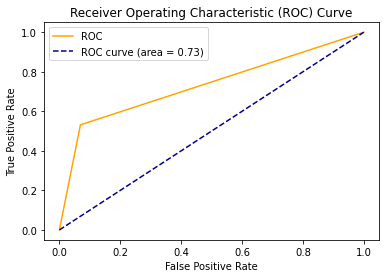

In [25]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

# Decision Tree

In [26]:
D_Tree = DecisionTreeClassifier()
D_Tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [27]:
feature_name=list(X.columns)
class_name = list(y_train.unique())
feature_name

['sex',
 'age',
 'fnlwgt',
 'education_num',
 'capital_gain',
 'capital_loss',
 'hours_per_week',
 'workclass',
 'marital_status',
 'occupation',
 'relationship',
 'race',
 'country']

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.269545 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.269545 to fit



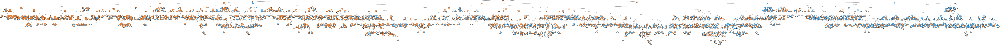

In [28]:
dot_data = export_graphviz(D_Tree,feature_names = feature_name,rounded = True,filled = True)
graph = pydotplus.graph_from_dot_data(dot_data)  
graph.write_png("myTree.png")
Image(graph.create_png())

In [29]:
D_Tree.score(X_train,y_train)

1.0

In [30]:
py_pred = D_Tree.predict(X_test)
D_Tree.score(X_test,y_test)

0.8048260231969071

In [31]:
print("Score on Train dataset: {}".format(D_Tree.score(X_train, y_train)))
print("Score on Test dataset: {}".format(D_Tree.score(X_test, y_test)))

Score on Train dataset: 1.0
Score on Test dataset: 0.8048260231969071


In [32]:
grid_parameter = {
    'criterion': ['gini', 'entropy'],
    'max_depth' : range(2,32,1),
    'min_samples_leaf' : range(1,10,1),
    'min_samples_split': range(2,10,1),
    'splitter' : ['best', 'random']    
}

In [33]:
grid_search_DT = GridSearchCV(estimator=D_Tree,
                     param_grid=grid_parameter,
                     cv=5,
                    n_jobs =-1)

In [34]:
grid_search_DT.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 32),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [35]:
grid_search_DT.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_leaf': 4,
 'min_samples_split': 8,
 'splitter': 'best'}

In [36]:
grid_search_DT.best_score_

0.8496197092004246

In [37]:
D_Tree = DecisionTreeClassifier(criterion='entropy', max_depth=9, min_samples_leaf=5, min_samples_split=6, splitter='best')
D_Tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=9, min_samples_leaf=5,
                       min_samples_split=6)

In [38]:
y_pred_DT = D_Tree.predict(X_test)
print("Score on Train dataset: {}".format(D_Tree.score(X_train, y_train)))
print("Score on Test dataset: {}".format(D_Tree.score(X_test, y_test)))

Score on Train dataset: 0.8588632626760876
Score on Test dataset: 0.8542860951873084


In [39]:
y_pred_DT = D_Tree.predict(X_test)

In [40]:
conf_mat_DT = confusion_matrix(y_test,y_pred_DT)
conf_mat_DT

array([[5196,  484],
       [ 609, 1212]])

# K-NN

In [41]:
knn_C = KNeighborsClassifier()
knn_C.fit(X_train, y_train)

KNeighborsClassifier()

In [42]:
print("Score on Train dataset: {}".format(knn_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(knn_C.score(X_test, y_test)))

Score on Train dataset: 0.8748611296271608
Score on Test dataset: 0.824690041327823


In [43]:
y_pred_Knn = knn_C.predict(X_test)
conf_mat_Knn = confusion_matrix(y_test,y_pred_Knn)
conf_mat_Knn

array([[5106,  574],
       [ 741, 1080]])

In [44]:
grid_parameter_knn = { 'algorithm' : ['ball_tree', 'kd_tree', 'brute'],
               'leaf_size' : [18,20,25,27,30,32,34],
               'n_neighbors' : [3,5,7,9,10,11,12,13,15,17]
              }

In [45]:
grid_search_knn = GridSearchCV(knn_C, grid_parameter_knn, cv=5,verbose=3)
grid_search_knn.fit(X_train, y_train)

Fitting 5 folds for each of 210 candidates, totalling 1050 fits
[CV 1/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3; total time=   2.2s
[CV 2/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3; total time=   2.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3; total time=   2.2s
[CV 4/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3; total time=   2.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3; total time=   2.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5; total time=   2.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5; total time=   2.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5; total time=   2.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5; total time=   2.2s
[CV 5/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5; total time=   2.2s
[CV 1/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=7; total time=   2.2s
[CV 2/5] END algorithm=ball_tree, 

[CV 5/5] END algorithm=ball_tree, leaf_size=20, n_neighbors=17; total time=   2.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=3; total time=   2.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=3; total time=   2.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=3; total time=   2.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=3; total time=   2.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=3; total time=   2.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=5; total time=   2.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=5; total time=   2.2s
[CV 3/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=5; total time=   2.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=5; total time=   2.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=5; total time=   2.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=7; total time=   2.1s
[CV 2/5] END al

[CV 5/5] END algorithm=ball_tree, leaf_size=27, n_neighbors=17; total time=   2.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=3; total time=   2.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=3; total time=   2.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=3; total time=   2.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=3; total time=   2.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=3; total time=   2.4s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=5; total time=   3.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=5; total time=   2.7s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=5; total time=   2.7s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=5; total time=   2.4s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=5; total time=   2.4s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=7; total time=   2.4s
[CV 2/5] END al

[CV 5/5] END algorithm=ball_tree, leaf_size=32, n_neighbors=17; total time=   2.2s
[CV 1/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=3; total time=   2.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=3; total time=   2.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=3; total time=   2.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=3; total time=   2.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=3; total time=   2.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=5; total time=   2.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=5; total time=   2.2s
[CV 3/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=5; total time=   2.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=5; total time=   2.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=5; total time=   2.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=7; total time=   2.1s
[CV 2/5] END al

[CV 1/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=3; total time=   1.4s
[CV 2/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=3; total time=   1.3s
[CV 3/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=3; total time=   1.4s
[CV 4/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=3; total time=   1.3s
[CV 5/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=3; total time=   1.3s
[CV 1/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=5; total time=   1.5s
[CV 2/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=5; total time=   1.4s
[CV 3/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=5; total time=   1.5s
[CV 4/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=5; total time=   1.4s
[CV 5/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=5; total time=   1.5s
[CV 1/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=7; total time=   1.6s
[CV 2/5] END .algorithm=kd_tree, leaf_size=20, n_neighbors=7; total time=   1.6s
[CV 3/5] END .algorithm=kd_t

[CV 3/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=3; total time=   1.4s
[CV 4/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=3; total time=   1.3s
[CV 5/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=3; total time=   1.3s
[CV 1/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=5; total time=   1.5s
[CV 2/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=5; total time=   1.4s
[CV 3/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=5; total time=   1.5s
[CV 4/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=5; total time=   1.6s
[CV 5/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=5; total time=   1.5s
[CV 1/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=7; total time=   1.6s
[CV 2/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=7; total time=   1.5s
[CV 3/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=7; total time=   1.6s
[CV 4/5] END .algorithm=kd_tree, leaf_size=27, n_neighbors=7; total time=   1.5s
[CV 5/5] END .algorithm=kd_t

[CV 5/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=3; total time=   1.4s
[CV 1/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=5; total time=   1.5s
[CV 2/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=5; total time=   1.5s
[CV 3/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=5; total time=   1.5s
[CV 4/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=5; total time=   1.4s
[CV 5/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=5; total time=   1.5s
[CV 1/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=7; total time=   1.5s
[CV 2/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=7; total time=   1.5s
[CV 3/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=7; total time=   1.6s
[CV 4/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=7; total time=   1.5s
[CV 5/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=7; total time=   1.5s
[CV 1/5] END .algorithm=kd_tree, leaf_size=32, n_neighbors=9; total time=   1.7s
[CV 2/5] END .algorithm=kd_t

[CV 2/5] END ...algorithm=brute, leaf_size=18, n_neighbors=5; total time=   1.4s
[CV 3/5] END ...algorithm=brute, leaf_size=18, n_neighbors=5; total time=   1.4s
[CV 4/5] END ...algorithm=brute, leaf_size=18, n_neighbors=5; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=18, n_neighbors=5; total time=   1.3s
[CV 1/5] END ...algorithm=brute, leaf_size=18, n_neighbors=7; total time=   1.5s
[CV 2/5] END ...algorithm=brute, leaf_size=18, n_neighbors=7; total time=   1.4s
[CV 3/5] END ...algorithm=brute, leaf_size=18, n_neighbors=7; total time=   1.4s
[CV 4/5] END ...algorithm=brute, leaf_size=18, n_neighbors=7; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=18, n_neighbors=7; total time=   1.3s
[CV 1/5] END ...algorithm=brute, leaf_size=18, n_neighbors=9; total time=   1.5s
[CV 2/5] END ...algorithm=brute, leaf_size=18, n_neighbors=9; total time=   1.4s
[CV 3/5] END ...algorithm=brute, leaf_size=18, n_neighbors=9; total time=   1.4s
[CV 4/5] END ...algorithm=br

[CV 4/5] END ...algorithm=brute, leaf_size=25, n_neighbors=5; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=25, n_neighbors=5; total time=   1.3s
[CV 1/5] END ...algorithm=brute, leaf_size=25, n_neighbors=7; total time=   1.5s
[CV 2/5] END ...algorithm=brute, leaf_size=25, n_neighbors=7; total time=   1.4s
[CV 3/5] END ...algorithm=brute, leaf_size=25, n_neighbors=7; total time=   1.4s
[CV 4/5] END ...algorithm=brute, leaf_size=25, n_neighbors=7; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=25, n_neighbors=7; total time=   1.3s
[CV 1/5] END ...algorithm=brute, leaf_size=25, n_neighbors=9; total time=   1.5s
[CV 2/5] END ...algorithm=brute, leaf_size=25, n_neighbors=9; total time=   1.4s
[CV 3/5] END ...algorithm=brute, leaf_size=25, n_neighbors=9; total time=   1.4s
[CV 4/5] END ...algorithm=brute, leaf_size=25, n_neighbors=9; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=25, n_neighbors=9; total time=   1.3s
[CV 1/5] END ..algorithm=bru

[CV 1/5] END ...algorithm=brute, leaf_size=30, n_neighbors=7; total time=   1.6s
[CV 2/5] END ...algorithm=brute, leaf_size=30, n_neighbors=7; total time=   1.4s
[CV 3/5] END ...algorithm=brute, leaf_size=30, n_neighbors=7; total time=   1.4s
[CV 4/5] END ...algorithm=brute, leaf_size=30, n_neighbors=7; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=30, n_neighbors=7; total time=   1.3s
[CV 1/5] END ...algorithm=brute, leaf_size=30, n_neighbors=9; total time=   1.5s
[CV 2/5] END ...algorithm=brute, leaf_size=30, n_neighbors=9; total time=   1.4s
[CV 3/5] END ...algorithm=brute, leaf_size=30, n_neighbors=9; total time=   1.4s
[CV 4/5] END ...algorithm=brute, leaf_size=30, n_neighbors=9; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=30, n_neighbors=9; total time=   1.3s
[CV 1/5] END ..algorithm=brute, leaf_size=30, n_neighbors=10; total time=   1.5s
[CV 2/5] END ..algorithm=brute, leaf_size=30, n_neighbors=10; total time=   1.4s
[CV 3/5] END ..algorithm=bru

[CV 3/5] END ...algorithm=brute, leaf_size=34, n_neighbors=7; total time=   1.4s
[CV 4/5] END ...algorithm=brute, leaf_size=34, n_neighbors=7; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=34, n_neighbors=7; total time=   1.3s
[CV 1/5] END ...algorithm=brute, leaf_size=34, n_neighbors=9; total time=   1.5s
[CV 2/5] END ...algorithm=brute, leaf_size=34, n_neighbors=9; total time=   1.4s
[CV 3/5] END ...algorithm=brute, leaf_size=34, n_neighbors=9; total time=   1.4s
[CV 4/5] END ...algorithm=brute, leaf_size=34, n_neighbors=9; total time=   1.3s
[CV 5/5] END ...algorithm=brute, leaf_size=34, n_neighbors=9; total time=   1.3s
[CV 1/5] END ..algorithm=brute, leaf_size=34, n_neighbors=10; total time=   1.5s
[CV 2/5] END ..algorithm=brute, leaf_size=34, n_neighbors=10; total time=   1.4s
[CV 3/5] END ..algorithm=brute, leaf_size=34, n_neighbors=10; total time=   1.4s
[CV 4/5] END ..algorithm=brute, leaf_size=34, n_neighbors=10; total time=   1.3s
[CV 5/5] END ..algorithm=bru

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [18, 20, 25, 27, 30, 32, 34],
                         'n_neighbors': [3, 5, 7, 9, 10, 11, 12, 13, 15, 17]},
             verbose=3)

In [46]:
grid_search_knn.best_params_

{'algorithm': 'ball_tree', 'leaf_size': 18, 'n_neighbors': 17}

In [47]:
Knn_C = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size =18, n_neighbors =17)

In [48]:
Knn_C.fit(X_train, y_train)

KNeighborsClassifier(algorithm='ball_tree', leaf_size=18, n_neighbors=17)

In [49]:
print("Score on Train dataset: {}".format(knn_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(knn_C.score(X_test, y_test)))

Score on Train dataset: 0.8748611296271608
Score on Test dataset: 0.824690041327823


In [50]:
y_pred_Knn = knn_C.predict(X_test)
conf_mat_Knn = confusion_matrix(y_test,y_pred_Knn)
conf_mat_Knn

array([[5106,  574],
       [ 741, 1080]])

# RandomForest Classification

In [51]:
raf_C = RandomForestClassifier(random_state=30)
raf_C.fit(X_train, y_train)

RandomForestClassifier(random_state=30)

In [52]:
print("Score on Train dataset: {}".format(raf_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(raf_C.score(X_test, y_test)))

Score on Train dataset: 0.9999555614806914
Score on Test dataset: 0.8512198373550194


In [53]:
grid_param_Raf = {
    "n_estimators" : [90,100,115,130],
    'criterion': ['gini', 'entropy'],
    'min_samples_leaf' : [1,2,3,4],
    'min_samples_split': [5,6,7,8],
    'max_features' : ['auto','log2']
}

In [54]:
grid_search_Raf = GridSearchCV(raf_C, param_grid=grid_param_Raf,cv=5, n_jobs=3, verbose = 3)
grid_search_Raf.fit(X_train, y_train)

Fitting 5 folds for each of 256 candidates, totalling 1280 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=30), n_jobs=3,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 'log2'],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'min_samples_split': [5, 6, 7, 8],
                         'n_estimators': [90, 100, 115, 130]},
             verbose=3)

In [55]:
grid_search_Raf.best_params_

{'criterion': 'gini',
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 8,
 'n_estimators': 115}

In [56]:
grid_search_Raf.best_score_

0.8609072749265596

In [57]:
raf_C = RandomForestClassifier(criterion= 'gini',max_features= 'auto',min_samples_leaf= 4,min_samples_split= 5,n_estimators= 115, random_state=10)
raf_C.fit(X_train, y_train)

RandomForestClassifier(min_samples_leaf=4, min_samples_split=5,
                       n_estimators=115, random_state=10)

In [58]:
print("Score on Train dataset: {}".format(raf_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(raf_C.score(X_test, y_test)))

Score on Train dataset: 0.9041461138514865
Score on Test dataset: 0.8630849220103987


# SVC

In [59]:
svc_C = SVC(C=500, gamma=0.1, kernel='poly')
svc_C.fit(X_train, y_train)

SVC(C=500, gamma=0.1, kernel='poly')

In [60]:
print("Score on Train dataset: {}".format(svc_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(svc_C.score(X_test, y_test)))

Score on Train dataset: 0.8504199440074657
Score on Test dataset: 0.8461538461538461


In [61]:
y_pred_svc = svc_C.predict(X_test)
conf_mat_svc = confusion_matrix(y_test,y_pred_svc)
conf_mat_svc

array([[5345,  335],
       [ 819, 1002]])

# Naive Bayes

In [62]:
NB_C = GaussianNB()
NB_C.fit(X_train, y_train)

GaussianNB()

In [63]:
print("Score on Train dataset: {}".format(NB_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(NB_C.score(X_test, y_test)))

Score on Train dataset: 0.80655912544994
Score on Test dataset: 0.811358485535262


In [64]:
y_pred = NB_C.predict(X_test)
conf_mat_NB = confusion_matrix(y_test,y_pred)
conf_mat_NB

array([[5359,  321],
       [1094,  727]])

# AdaBoost Classifier

In [65]:
AdaBoost_C = AdaBoostClassifier()
AdaBoost_C.fit(X_train, y_train)

AdaBoostClassifier()

In [66]:
print("Score on Train dataset: {}".format(AdaBoost_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(AdaBoost_C.score(X_test, y_test)))

Score on Train dataset: 0.8546860418610852
Score on Test dataset: 0.858152246367151


In [67]:
grid_param_ADA = {"n_estimators" :[10, 100, 200, 250],
              "learning_rate":  [0.05, 0.5, 1.5, 2.5]}

In [68]:
grid_search_ADA = GridSearchCV(AdaBoost_C, param_grid=grid_param_ADA, cv=5, n_jobs=3, verbose=3)
grid_search_ADA.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=3,
             param_grid={'learning_rate': [0.05, 0.5, 1.5, 2.5],
                         'n_estimators': [10, 100, 200, 250]},
             verbose=3)

In [69]:
grid_search_ADA.best_params_

{'learning_rate': 1.5, 'n_estimators': 200}

In [70]:
AdaBoost_C = AdaBoostClassifier(learning_rate=1.5, n_estimators=250)
AdaBoost_C.fit(X_train, y_train)

AdaBoostClassifier(learning_rate=1.5, n_estimators=250)

In [71]:
print("Score on Train dataset: {}".format(AdaBoost_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(AdaBoost_C.score(X_test, y_test)))

Score on Train dataset: 0.8685952984046572
Score on Test dataset: 0.8644180775896547


# GradientBoosting Classifier

In [72]:
GradientBoost_C = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
GradientBoost_C.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=1.0, max_depth=1, random_state=0)

In [73]:
print("Score on Train dataset: {}".format(GradientBoost_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(GradientBoost_C.score(X_test, y_test)))

Score on Train dataset: 0.8555303737279474
Score on Test dataset: 0.8549526729769364


In [74]:
grid_param_Grad = {
              'n_estimators' : [25, 50 ,75, 100, 200],
              'learning_rate': [0.005 ,0.05, 0.5, 1.5],
              'max_depth': [2, 4, 6, 8],
              'max_features': [10, 12, 17] 
              }

In [75]:
grid_search_Grad = GridSearchCV(GradientBoost_C, param_grid=grid_param_Grad, cv=5, scoring="accuracy", n_jobs= 3, verbose = 1)
grid_search_Grad.fit(X_train, y_train)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


/home/maverick14k/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:918: UserWarning: One or more of the test scores are non-finite: [0.74870017 0.74870017 0.74870017 0.74870017 0.79229452 0.74870017
 0.74870017 0.74870017 0.75803228 0.789628          nan        nan
        nan        nan        nan 0.74870017 0.74870017 0.74870017
 0.79447189 0.84073236 0.74870017 0.74870017 0.74870017 0.79984875
 0.84091008        nan        nan        nan        nan        nan
 0.74870017 0.74870017 0.74870017 0.80624806 0.84570947 0.74870017
 0.74870017 0.74870017 0.80740353 0.84548721        nan        nan
        nan        nan        nan 0.74870017 0.74870017 0.74870017
 0.81140291 0.84766471 0.74870017 0.74870017 0.74870017 0.81144724
 0.84610934        nan        nan        nan        nan        nan
 0.83539986 0.84264312 0.84628708 0.84966435 0.85424166 0.8379327
 0.84335415 0.84753138 0.85064202 0.85397504        nan        nan
        nan        nan        nan 0.84419

GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(learning_rate=1.0,
                                                  max_depth=1, random_state=0),
             n_jobs=3,
             param_grid={'learning_rate': [0.005, 0.05, 0.5, 1.5],
                         'max_depth': [2, 4, 6, 8],
                         'max_features': [10, 12, 17],
                         'n_estimators': [25, 50, 75, 100, 200]},
             scoring='accuracy', verbose=1)

In [76]:
grid_search_Grad.best_params_

{'learning_rate': 0.05,
 'max_depth': 6,
 'max_features': 12,
 'n_estimators': 200}

In [77]:
GradientBoost_C = GradientBoostingClassifier(learning_rate=0.05, max_depth=6, max_features=12, n_estimators=200)
GradientBoost_C.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.05, max_depth=6, max_features=12,
                           n_estimators=200)

In [78]:
print("Score on Train dataset: {}".format(GradientBoost_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(GradientBoost_C.score(X_test, y_test)))

Score on Train dataset: 0.894591832200151
Score on Test dataset: 0.8694840687908278


# Stacking Technique

In [79]:
estimators = [('rf', raf_C),('svr', make_pipeline(StandardScaler(),LinearSVC(random_state=42)))]

In [80]:
Stacking_C = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
Stacking_C.fit(X_train, y_train)

/home/maverick14k/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/maverick14k/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/maverick14k/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/maverick14k/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/maverick14k/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning

StackingClassifier(estimators=[('rf',
                                RandomForestClassifier(min_samples_leaf=4,
                                                       min_samples_split=5,
                                                       n_estimators=115,
                                                       random_state=10)),
                               ('svr',
                                Pipeline(steps=[('standardscaler',
                                                 StandardScaler()),
                                                ('linearsvc',
                                                 LinearSVC(random_state=42))]))],
                   final_estimator=LogisticRegression())

In [81]:
print("Score on Train dataset: {}".format(Stacking_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(Stacking_C.score(X_test, y_test)))

Score on Train dataset: 0.8999244545171755
Score on Test dataset: 0.8625516597786962


# Bagging Classifier

In [82]:
Bagging_C = BaggingClassifier(base_estimator=raf_C, n_estimators=10, random_state=0)
Bagging_C.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(min_samples_leaf=4,
                                                        min_samples_split=5,
                                                        n_estimators=115,
                                                        random_state=10),
                  random_state=0)

In [83]:
print("Score on Train dataset: {}".format(Bagging_C.score(X_train, y_train)))
print("Score on Test dataset: {}".format(Bagging_C.score(X_test, y_test)))

Score on Train dataset: 0.8895258409989779
Score on Test dataset: 0.8617517664311425


In [84]:
model_List = [log_reg, D_Tree, raf_C, knn_C, svc_C, NB_C, AdaBoost_C, GradientBoost_C]
Algo_Name = ["LogisticRegression", "DecisionTreeClassifier", "RandomForestClassifier", "KNeighborsClassifier", "SVC", "NaiveBayes", "AdaBoostClassifier", "GradientBoostingClassifier"]
Test_Score = []
Train_Score = []
for i in model_List:
    Train_Score.append(i.score(X_train, y_train))
    Test_Score.append(i.score(X_test, y_test))
Result = pd.DataFrame()
Result['Name'] = Algo_Name
Result['Train_Score'] = Train_Score
Result['Test_Score'] = Test_Score

In [85]:
Result

,Name,Train_Score,Test_Score
0,LogisticRegression,0.834155,0.834022
1,DecisionTreeClassifier,0.858863,0.854286
2,RandomForestClassifier,0.904146,0.863085
3,KNeighborsClassifier,0.874861,0.824690
4,SVC,0.850420,0.846154
5,NaiveBayes,0.806559,0.811358
6,AdaBoostClassifier,0.868595,0.864418
7,GradientBoostingClassifier,0.894592,0.869484


In [87]:
pk.dump(GradientBoost_C, open('finalized_model.pickle', 'wb'))